# Lane Line Detection Project

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Arrow
import cv2
from moviepy.editor import VideoFileClip
%matplotlib inline

## Image Shape

An image with dimensions (n, m, k) represents a 3-dimensional array or tensor, including:

First Dimension (n): This corresponds to the number of rows in the image. It represents the height of the image, indicating how many horizontal sections the image is divided into.

Second Dimension (m): This represents the number of columns in the image. It signifies the width of the image, indicating how many vertical sections the image is divided into.

Third Dimension (k): This dimension signifies the number of channels. In the context of color images using the RGB color model, k would be 3, representing the intensity of red, green, and blue at each pixel. However, in other contexts, such as grayscale images, k might be 1, as there is only one intensity value per pixel.

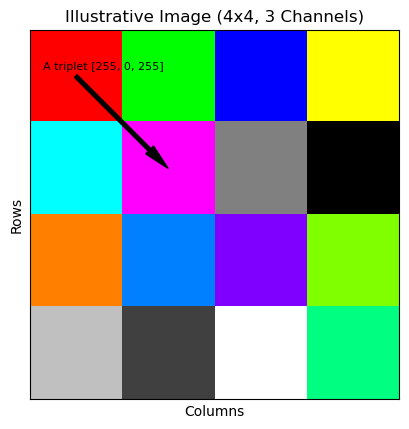

In [2]:
# Create an illustrative image with dimensions (4, 4, 3)
illustrative_image = np.array([[[255, 0, 0], [0, 255, 0], [0, 0, 255], [255, 255, 0]],
                               [[0, 255, 255], [255, 0, 255], [128, 128, 128], [0, 0, 0]],
                               [[255, 128, 0], [0, 128, 255], [128, 0, 255], [128, 255, 0]],
                               [[192, 192, 192], [64, 64, 64], [255, 255, 255], [0, 255, 128]]
                              ], dtype=np.uint8)

# Display the illustrative image
fig, ax = plt.subplots()
ax.imshow(illustrative_image)
ax.set_title('Illustrative Image (4x4, 3 Channels)')
ax.set_xlabel('Columns')
ax.set_ylabel('Rows')
ax.set_xticks([])
ax.set_yticks([])

# Arrow pointing to a specific pixel
arrow_tail = (0, 0)  # Tail of the arrow (row, column)
arrow_head = (1, 1)  # Head of the arrow (row, column)
arrow = Arrow(arrow_tail[1], arrow_tail[0], arrow_head[1] - arrow_tail[1], arrow_head[0] - arrow_tail[0],
              color='black', width=0.2)
ax.add_patch(arrow)
text_position = (arrow_tail[1]+0.3, arrow_tail[0] - 0.1)  # Position for the text (row, column)
ax.text(*text_position, 'A triplet [255, 0, 255]', color='black', fontsize=8, ha='center', va='center')

plt.show()

## Read in an Image

In [3]:
#reading in an image
img = cv2.imread('test_images/solidWhiteRight.jpg')
image = np.copy(img)
#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


## Function Declaration

In [4]:
# Function to get vertices of the region of interest
def getVertices(image):
    rows, cols = image.shape[:2]
    bottom_left  = [cols*0.15, rows]
    top_left     = [cols*0.45, rows*0.6]
    bottom_right = [cols*0.95, rows]
    top_right    = [cols*0.55, rows*0.6] 
    
    ver = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    return ver

# Function for Canny edge detection
def Canny(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray_image, (5,5), 0)
    canny = cv2.Canny(blur, 50, 150)
    return canny

# Function to identify the region of interest
def identifyRegionInterest(image):
    polygons = getVertices(image)
    mask = np.zeros_like(image) 
    cv2.fillPoly(mask, polygons, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

# Function to transform color threshold
def transformColorThreshold(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    lower_white = np.array([0, 200, 0], dtype=np.uint8)
    upper_white = np.array([255, 255, 255], dtype=np.uint8)
    lower_yellow = np.array([10, 0, 100], dtype=np.uint8)
    upper_yellow = np.array([40, 255, 255], dtype=np.uint8)
    white_mask = cv2.inRange(hls, lower_white, upper_white)
    yellow_mask = cv2.inRange(hls, lower_yellow, upper_yellow)
    combined_mask = cv2.bitwise_or(white_mask, yellow_mask)
    result = cv2.bitwise_and(image, image, mask=combined_mask)
    return result

# Function to find the equation of a line
def findLineEquation(x1, y1, x2, y2):
    slope = (y2 - y1) / (x2 - x1 + 1e-5)
    intercept = y1 - slope * x1
    return slope, intercept

# Function to create an invisible line
def createInviLine(image, line):
    x1, y1 = line[0]
    x2, y2 = line[1]
    
    slope, intercept = findLineEquation(x1, y1, x2, y2)
    
    y1_inv = int(image.shape[0] * 0.75)
    x1_inv = int((y1_inv - intercept) / slope)

    y2_inv = image.shape[0]  # The y-coordinate of the bottom of the image
    x2_inv = int((y2_inv - intercept) / slope)
    
    invisible_line = [(x1_inv, y1_inv), (x2_inv, y2_inv)]
    return invisible_line

# Function to detect lane lines
def detectLaneLines(image):
    global last_invisible_left_line, last_invisible_right_line
    left_line = []
    right_line = []
    color_threshed = transformColorThreshold(image)
    cropped_img = identifyRegionInterest(color_threshed)
    edges = Canny(cropped_img)
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, 50, np.array([]), minLineLength=10, maxLineGap=5)
    line_img = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)

    if lines is not None and len(lines) > 0: 
        for line in lines:
            for x1, y1, x2, y2 in line:
                slope = (y2 - y1) / (x2 - x1 + 1e-5)
                if abs(slope) > 0.5:
                    if slope < 0:
                        left_line.append((x1, y1))
                        left_line.append((x2, y2))
                    else:
                        right_line.append((x1, y1))
                        right_line.append((x2, y2))
        combo_img = cv2.addWeighted(image, 0.8, line_img, 1, 0)
        
    try:
        # Create invisible lines
        invisible_left_line = createInviLine(image, left_line)
        invisible_right_line = createInviLine(image, right_line)

        # Update the last successfully detected invisible lines
        last_invisible_left_line = invisible_left_line
        last_invisible_right_line = invisible_right_line
            
        # Draw the polygon between the invisible lines with light blue color and fade out
        if last_invisible_left_line is not None and last_invisible_right_line is not None:
            fade_combo_img = np.copy(image)
            cv2.fillPoly(fade_combo_img, [np.array([last_invisible_left_line[0], last_invisible_right_line[0], 
                                                     last_invisible_right_line[1], last_invisible_left_line[1]])],
                         color=(173, 216, 230))            
    
            cv2.polylines(fade_combo_img, [np.array(left_line)], isClosed=False, color=(255, 0, 0), thickness=10)
            cv2.polylines(fade_combo_img, [np.array(right_line)], isClosed=False, color=(255, 0, 0), thickness=10)
            combo_img = cv2.addWeighted(combo_img, 0.6, fade_combo_img, 0.4, 0)
        return combo_img
    except Exception:
        # Use the coordinates from the last successfully detected lines
        if last_invisible_left_line is not None and last_invisible_right_line is not None:
            fade_combo_img = np.copy(image)
            cv2.fillPoly(fade_combo_img, [np.array([last_invisible_left_line[0], last_invisible_right_line[0], 
                                                     last_invisible_right_line[1], last_invisible_left_line[1]])],
                         color=(173, 216, 230))
            cv2.polylines(fade_combo_img, [np.array(left_line)], isClosed=False, color=(255, 0, 0), thickness=10)
            cv2.polylines(fade_combo_img, [np.array(right_line)], isClosed=False, color=(255, 0, 0), thickness=10)
            combo_img = cv2.addWeighted(combo_img, 0.6, fade_combo_img, 0.4, 0)
            return combo_img
        else:
            return image

## Testing with images

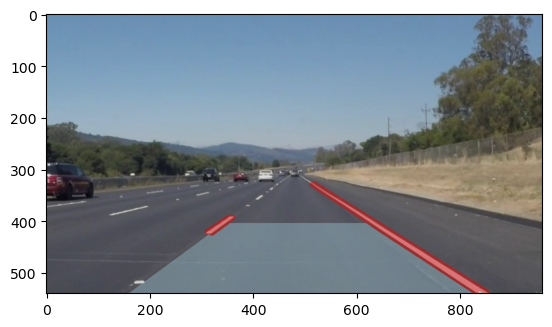

In [5]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Find and display curved lanes with polygon
result = detectLaneLines(image)
plt.imshow(result)
plt.show()

## Testing with videos

In [6]:
clip = VideoFileClip("test_videos/solidYellowCurve.mp4")

processed_clip = clip.fl_image(detectLaneLines)

#output_video_file = "path/to/save/videos"
#processed_clip.write_videofile(output_video_file, audio=False, codec="libx264", fps=clip.fps)

processed_clip.ipython_display(width="100%", autoplay=True, loop=True)

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
